# EECS 442 Final Project: Inversion-based Style Transfer

Member: Shangjun Meng (shangjun), Yihang Bi (byihang), Zimo Si (zimosi), Jirong Yang (yjrcs)

Reference papers: https://arxiv.org/pdf/2208.01618


In [22]:
!pip list | grep torch
!pip install accelerate diffusers transformers

torch                            2.2.1+cu121
torchaudio                       2.2.1+cu121
torchdata                        0.7.1
torchsummary                     1.5.1
torchtext                        0.17.1
torchvision                      0.17.1+cu121


In [23]:
from google.colab import drive
drive.mount('/content/drive')
!ls
%cd /content/drive/MyDrive/textual_inversion_style_transfer

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
'Copy of StyleTransfer.ipynb'   resource	       TextInvDataset.py
 InST_applied.ipynb	        sd-concept-output      Using_hwresult_asnoise.ipynb
 output			        stablediffusion-main
 __pycache__		        StyleTransfer.ipynb
/content/drive/.shortcut-targets-by-id/1hYg5kbVgBs7gbV1uhLWaj61I1ZgGo4u8/textual_inversion_style_transfer


In [ ]:
import itertools
import math
import os
import random
import matplotlib.pyplot as plt

import PIL
import accelerate
import numpy as np
import torch
import torch.nn.functional as F
import torch.utils.checkpoint
from PIL import Image
from accelerate import Accelerator
from diffusers import (
    AutoencoderKL,
    DDPMScheduler,
    StableDiffusionPipeline,
    UNet2DConditionModel,
    DPMSolverMultistepScheduler
)
from torch.utils.data import Dataset
from torchvision import transforms
from tqdm.auto import tqdm
from transformers import CLIPTextModel, CLIPTokenizer

import TextInvDataset
from TextInvDataset import TextualInversionDataset



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# pretrained_path = "stabilityai/stable-diffusion-xl-base-1.0"
pretrained_path = "stabilityai/stable-diffusion-2-1"
style_path = "./resource/style/comic"
object_path = "./resource/objects/bmw_m4"

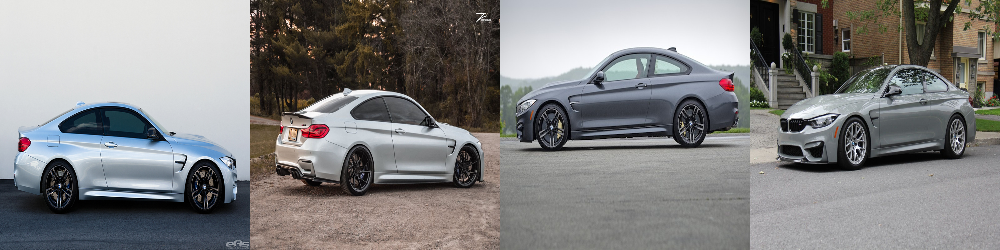

In [ ]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols * w, rows * h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

images = []
for file_path in os.listdir(object_path):
    try:
        image_path = os.path.join(object_path, file_path)
        images.append(Image.open(image_path).resize((768, 768)))
    except:
        print(
            f"{image_path} is not a valid image, "
            f"please make sure to remove this file from the directory otherwise the training could fail."
        )
image_grid(images, 1, len(images)) #display content for style transfer

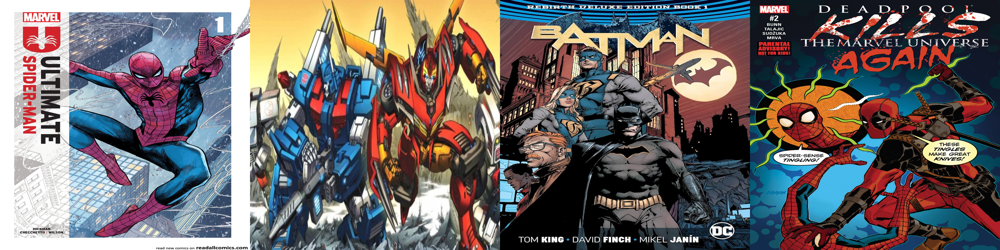

In [ ]:
images = []
for file_path in os.listdir(style_path):
    try:
        image_path = os.path.join(style_path, file_path)
        images.append(Image.open(image_path).resize((768, 768)))
    except:
        print(
            f"{image_path} is not a valid image, "
            f"please make sure to remove this file from the directory otherwise the training could fail."
        )
image_grid(images, 1, len(images)) #display style reference for style transfer

In [ ]:
placeholder_content, placeholder_style = "<bmw-m4>", "<comic-book>"

initializer_content, initializer_style = "car", "comic" # a general existing token for content/style to start with

In [ ]:
tokenizer = CLIPTokenizer.from_pretrained(pretrained_path, subfolder="tokenizer")
num_added_tokens = tokenizer.add_tokens(placeholder_content)
num_added_tokens += tokenizer.add_tokens(placeholder_style)
if num_added_tokens == 0:
    raise ValueError(
        f"The tokenizer already contains the token {placeholder_content} or {placeholder_style}. "
        f"Please pass a different `placeholder token` that is not already in the tokenizer."
    )
token_ids = tokenizer.encode([initializer_content, initializer_style], add_special_tokens=False)

if len(token_ids) > 2:
    raise ValueError("The initializer tokens must be single token on their own.")

initializer_content_id, initializer_style_id = token_ids[0], token_ids[1]
placeholder_content_id = tokenizer.convert_tokens_to_ids(placeholder_content)
placeholder_style_id = tokenizer.convert_tokens_to_ids(placeholder_style)
placeholder_content_id, placeholder_style_id

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

(49408, 49409)

In [ ]:
text_encoder = CLIPTextModel.from_pretrained(pretrained_path, subfolder="text_encoder")
vae = AutoencoderKL.from_pretrained(pretrained_path, subfolder="vae")
unet = UNet2DConditionModel.from_pretrained(pretrained_path, subfolder="unet")

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

In [ ]:
#ready the encoder embed for the additional placeholders
text_encoder.resize_token_embeddings(len(tokenizer))

Embedding(49410, 1024)

Prepare the datasets for training

In [ ]:
train_dataset_content = TextualInversionDataset(
    dir_path= object_path,
    attribute="content",
    tokenizer=tokenizer,
    placeholder_token=placeholder_content,
    size=768,
    operation='train',
    interpolation='BL',
    repeat=50,
    flip=True,
    gray=False,
    prompt_list=None,
)

train_dataset_style = TextualInversionDataset(
    dir_path= style_path,
    attribute="style",
    tokenizer=tokenizer,
    placeholder_token=placeholder_style,
    size=768,
    operation='train',
    interpolation='BL',
    repeat=50,
    flip=True,
    gray=False,
    prompt_list=None,
)

In [ ]:
def create_dataloader(train_dataset, train_batch_size=1):
    return torch.utils.data.DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True)

In [ ]:

def freeze_params(params):
    """
    :param params: Module.parameters
    """
    for param in params:
        param.requires_grad = False


# freeze all of VAE and denoising UNet
freeze_params(vae.parameters())
freeze_params(unet.parameters())
# freeze Text Encoder (except Token Embedding)
params_to_freeze = itertools.chain(
    text_encoder.text_model.encoder.parameters(),
    text_encoder.text_model.final_layer_norm.parameters(),
    text_encoder.text_model.embeddings.position_embedding.parameters(),
)
freeze_params(params_to_freeze)

In [ ]:
noise_scheduler = DDPMScheduler.from_pretrained(pretrained_path, subfolder="scheduler")

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

In [ ]:
output_dir = "sd-concept-output"
hyperparameters = {
    "learning_rate": 5e-04,
    "scale_lr": True,
    "max_train_steps": 2000,
    "save_steps": 500,
    "train_batch_size": 4,
    "gradient_accumulation_steps": 1,
    "gradient_checkpointing": False,
    "mixed_precision": "fp16",
    "seed": 42,
    "output_dir": output_dir,
}

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

In [ ]:
def save_progress(text_encoder, placeholder_token_id, placeholder_token, accelerator, save_path):
    print("Saving embeddings")
    learned_embeds = accelerator.unwrap_model(text_encoder).get_input_embeddings().weight[placeholder_token_id]
    learned_embeds_dict = {placeholder_token: learned_embeds.detach().cpu()}
    torch.save(learned_embeds_dict, save_path)

In [ ]:
l_loss = []
def training_function(text_encoder, vae, unet, train_dataset, hyperparameters, placeholder_token_id, cname=None, ctype=None):
    train_batch_size = hyperparameters["train_batch_size"]
    gradient_accumulation_steps = hyperparameters["gradient_accumulation_steps"]
    learning_rate = hyperparameters["learning_rate"]
    max_train_steps = hyperparameters["max_train_steps"]
    output_dir = hyperparameters["output_dir"]
    gradient_checkpointing = hyperparameters["gradient_checkpointing"]

    accelerator = Accelerator(
        gradient_accumulation_steps=gradient_accumulation_steps,
        mixed_precision=hyperparameters["mixed_precision"]
    )

    if gradient_checkpointing:
        text_encoder.gradient_checkpointing_enable()
        unet.enable_gradient_checkpointing()
    print("Using ", train_dataset)
    train_dataloader = create_dataloader(train_dataset, train_batch_size)

    if hyperparameters["scale_lr"]:
        learning_rate = learning_rate * gradient_accumulation_steps * train_batch_size * accelerator.num_processes

    # set to only optimize embedding params
    optimizer = torch.optim.AdamW(text_encoder.get_input_embeddings().parameters(), lr=learning_rate)

    text_encoder, optimizer, train_dataloader = accelerator.prepare(text_encoder, optimizer, train_dataloader)

    weight_dtype = torch.float32
    if accelerator.mixed_precision == "fp16":
        weight_dtype = torch.float16
    elif accelerator.mixed_precision == "bf16":
        weight_dtype = torch.bfloat16

    vae.to(accelerator.device, dtype=weight_dtype)
    unet.to(accelerator.device, dtype=weight_dtype)

    # VAE frozen
    vae.eval()
    # UNet frozen, need to save though
    unet.train()

    num_update_steps_per_epoch = math.ceil(len(train_dataloader) / gradient_accumulation_steps)
    num_train_epochs = math.ceil(max_train_steps / num_update_steps_per_epoch)

    total_batch_size = train_batch_size * accelerator.num_processes * gradient_accumulation_steps

    print("***** Running training *****")
    print(f"  Num examples = {len(train_dataset)}")
    print(f"  This batch size per device = {train_batch_size}")
    print(f"  Total train batch size (w. parallel, distributed & accumulation) = {total_batch_size}")
    print(f"  Gradient Accumulation steps = {gradient_accumulation_steps}")
    print(f"  Total optimization steps = {max_train_steps}")

    progress_bar = tqdm(range(max_train_steps), disable=not accelerator.is_local_main_process)
    progress_bar.set_description("Steps")
    global_step = 0

    num_embeddings = text_encoder.get_input_embeddings().num_embeddings

    for epoch in range(num_train_epochs):
        text_encoder.train()
        for step, batch in enumerate(train_dataloader):
            with accelerator.accumulate(text_encoder):
                # Encode to latent space
                vae.encode(batch["pix_values"].to(dtype=weight_dtype))
                vae.encode(batch["pix_values"].to(dtype=weight_dtype)).latent_dist.sample()
                latents = vae.encode(batch["pix_values"].to(dtype=weight_dtype)).latent_dist.sample().detach()
                latents = latents * 0.18215
                # The resulting latent representations (latents) are sampled from the learned latent distribution.

                # generate noise
                noise = torch.randn_like(latents)
                bsz = latents.shape[0]
                # set random timestep
                timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (bsz,),
                                          device=latents.device).long()
                # add noise according to scheduler latent space
                noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

                # get conditioning text embedding
                encoder_hidden_states = text_encoder(batch["input_ids"])[0]

                # print(latents)
                # print(timesteps)
                # print(encoder_hidden_states)
                # predict noise
                noise_pred = unet(noisy_latents, timesteps, encoder_hidden_states.to(weight_dtype)).sample

                # predict target
                if noise_scheduler.config.prediction_type == "epsilon":
                    target = noise
                elif noise_scheduler.config.prediction_type == "v_prediction":
                    target = noise_scheduler.get_velocity(latents, noise, timesteps)
                else:
                    raise ValueError(f"Unknown prediction type {noise_scheduler.config.prediction_type}")

                loss = F.mse_loss(noise_pred, target, reduction="none").mean([1, 2, 3]).mean()
                accelerator.backward(loss)

                # only train placeholder tokens, don't need to tune other tokens
                if accelerator.num_processes > 1:
                    grads = text_encoder.module.get_input_embeddings().weight.grad
                else:
                    grads = text_encoder.get_input_embeddings().weight.grad
                index_grads_to_zero = torch.arange(num_embeddings) != placeholder_token_id
                grads.data[index_grads_to_zero, :] = grads.data[index_grads_to_zero, :].fill_(0)

                optimizer.step()
                optimizer.zero_grad()

            progress_bar.update(1)

            l_loss.append(loss.detach().item())
            logs = {"loss": loss.detach().item()}
            progress_bar.set_postfix(**logs)

            if global_step >= max_train_steps:
                break

        accelerator.wait_for_everyone()

    # save model
    if accelerator.is_main_process:
        pipeline = StableDiffusionPipeline.from_pretrained(
            pretrained_path,
            text_encoder=accelerator.unwrap_model(text_encoder),
            tokenizer=tokenizer,
            vae=vae,
            unet=unet,
        )
        pipeline.save_pretrained(output_dir)
        # save learned embedding
        save_path = os.path.join(output_dir, f"{cname}_{ctype}.bin")
        save_progress(text_encoder, placeholder_token_id, tokenizer.convert_ids_to_tokens(placeholder_token_id), accelerator, save_path)

Training for Style

In [ ]:
token_embeds = text_encoder.get_input_embeddings().weight.data
token_embeds[placeholder_style_id] = token_embeds[initializer_style_id]
num_embeddings = text_encoder.get_input_embeddings().num_embeddings
print(num_embeddings)

49410


In [ ]:
accelerate.notebook_launcher(training_function, num_processes=1,
                             args=(text_encoder, vae, unet, train_dataset_style, hyperparameters, placeholder_style_id, "comic-book", "style"))

for param in itertools.chain(unet.parameters(), text_encoder.parameters()):
    if param.grad is not None:
        del param.grad
    torch.cuda.empty_cache()

plt.figure()
plt.plot(range(len(l_loss)), torch.tensor(l_loss, device = 'cpu'))
# plt.legend('hist_D_100_losses')
plt.xlabel('Iteration')
plt.ylabel('loss')
plt.title('hist_D_100_losses')
plt.show()

Launching training on one GPU.
Using  TextInvDataset(attr: style, input size: 768*768, set size: 200)
***** Running training *****
  Num examples = 200
  This batch size per device = 4
  Total train batch size (w. parallel, distributed & accumulation) = 4
  Gradient Accumulation steps = 1
  Total optimization steps = 2000


  0%|          | 0/2000 [00:00<?, ?it/s]

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Saving embeddings


Training for Content

In [ ]:
token_embeds = text_encoder.get_input_embeddings().weight.data
token_embeds[placeholder_content_id] = token_embeds[initializer_content_id]
num_embeddings = text_encoder.get_input_embeddings().num_embeddings
print(num_embeddings)

49410


In [ ]:
accelerate.notebook_launcher(training_function, num_processes=1,
                             args=(text_encoder, vae, unet, train_dataset_content, hyperparameters, placeholder_content_id, "bmw-m4", "content"))

for param in itertools.chain(unet.parameters(), text_encoder.parameters()):
    if param.grad is not None:
        del param.grad
    torch.cuda.empty_cache()

Launching training on one GPU.
Using  TextInvDataset(attr: content, input size: 768*768, set size: 200)
***** Running training *****
  Num examples = 200
  This batch size per device = 4
  Total train batch size (w. parallel, distributed & accumulation) = 4
  Gradient Accumulation steps = 1
  Total optimization steps = 2000


  0%|          | 0/2000 [00:00<?, ?it/s]

KeyboardInterrupt: 

# Generation
Load original SDXL first

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained(
    pretrained_model_name_or_path=pretrained_path,
    scheduler=DPMSolverMultistepScheduler.from_pretrained(pretrained_path, subfolder="scheduler"),
    torch_dtype=torch.float16,
).to("cuda")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

load trained embeddings to pipeline

In [ ]:
pipe.load_textual_inversion("./sd-concept-output/comic-book_style.bin")
pipe.load_textual_inversion("./sd-concept-output/bmw-m4_content.bin")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

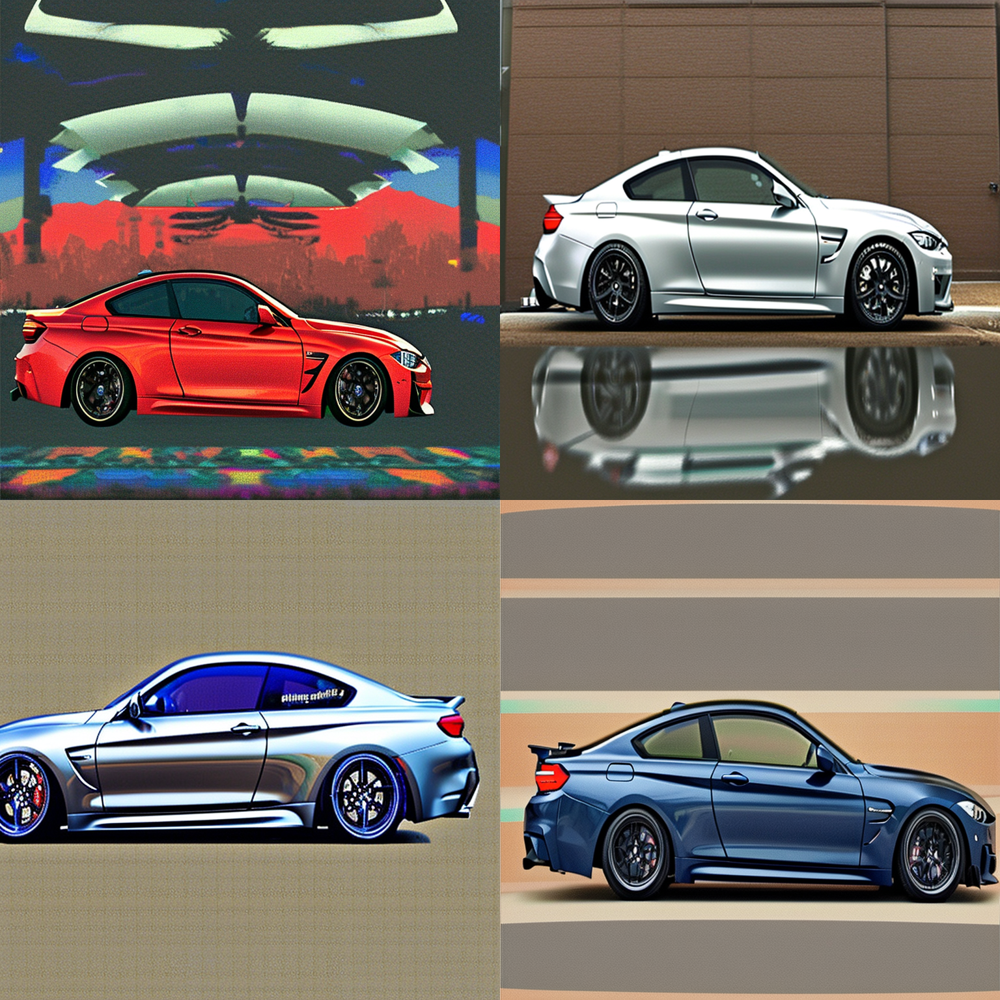

In [ ]:
prompt = "<bmw-m4> in the style of <comic-book>"

num_samples = 2
num_rows = 2

all_images = []
for _ in range(num_rows):
    images = pipe([prompt] * num_samples, num_inference_steps=50, guidance_scale=7.5).images
    all_images.extend(images)

grid = image_grid(all_images, num_rows, num_samples)
grid

In [ ]:
if not os.path.exists("output"):
  os.mkdir("output")

for i, image in enumerate(all_images):
    image.save(f"./output/output_{i}.png")

# Apply this to img2imgpipeline
Now we can also train the embeddings of the comic style for img2img pipeline, and directly have them work on the original images of BMW F82M4 for filter-like behavior.

In [ ]:
new_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    pretrained_model_name_or_path=pretrained_path,
    scheduler=DPMSolverMultistepScheduler.from_pretrained(pretrained_path, subfolder="scheduler"),
    torch_dtype=torch.float16,
).to("cuda")

In [ ]:
new_pipe.load_textual_inversion("./sd-concept-output/comic-book_style.bin")

prompt = "<comic-book>"

content_images = []
for file_path in os.listdir(object_path):
    try:
        image_path = os.path.join(object_path, file_path)
        content_images.append(Image.open(image_path))
